## Installing Required libraries

In [ ]:
pip install face_recognition opencv-python-headless pandas deepface moviepy imagehash scikit-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.1/100.1 MB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 7.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 24.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 72.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 94.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 65.6 MB/s eta 0:00:00
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566162 sha256=2c28f9cf02603c9d58c1e9c67b44dde1ccb1e377a096b71ae1efd61f17209391
  Stored in directory: /root/.cache/pip/wheels/7a/eb/cf/e9eced74122b679557f597bb7c8e4c739cfcac

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
from moviepy.editor import VideoFileClip
import face_recognition
from sklearn.cluster import DBSCAN
from collections import defaultdict
from PIL import Image
import imagehash

  if event.key is 'enter':



In [ ]:
pip install ultralytics opencv-python opencv-python-headless


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.9/896.9 kB 46.4 MB/s eta 0:00:00


In [ ]:
pip install face_recognition


# Used Yolov8l model to detect persons from each videos and saveed images in a folder
## Ps- It took approx more than 2hrs to run completely and detect persons from every video

In [ ]:
import os
import cv2
import numpy as np
from ultralytics import YOLO
import face_recognition  # For comparing faces

def detect_unique_faces_in_video(video_path, output_folder, model):
    """
    Detect unique faces in a video using YOLOv8 and save them.

    Args:
        video_path (str): Path to the input video.
        output_folder (str): Path to the folder where unique faces will be saved.
        model (YOLO): YOLOv8 model for detecting people.
    """
    # Extract video ID from filename
    video_id = os.path.splitext(os.path.basename(video_path))[0]

    # Initialize video capture
    cap = cv2.VideoCapture(video_path)
    unique_faces = []  # Reset for each video
    face_index = 0

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Perform YOLO detection
        results = model.predict(frame, conf=0.5, classes=[0])  # Class 0 corresponds to 'person'
        detections = (
            results[0].boxes.xyxy.cpu().numpy() if results[0].boxes else []
        )  # Move tensor to CPU and convert to NumPy

        for detection in detections:
            x1, y1, x2, y2 = map(int, detection[:4])  # Get bounding box coordinates
            person_crop = frame[y1:y2, x1:x2]

            # Ensure valid crop dimensions
            if person_crop.shape[0] == 0 or person_crop.shape[1] == 0:
                continue

            # Convert face crop to RGB for face comparison
            person_rgb = cv2.cvtColor(person_crop, cv2.COLOR_BGR2RGB)

            # Compute face encoding
            face_encodings = face_recognition.face_encodings(person_rgb)

            if face_encodings:
                # Check uniqueness by comparing with existing face encodings in this video
                is_unique = True
                for existing_face in unique_faces:
                    distance = face_recognition.face_distance([existing_face], face_encodings[0])[0]
                    if distance < 0.6:  # Threshold for considering two faces as the same
                        is_unique = False
                        break

                if is_unique:
                    # Save unique face
                    unique_faces.append(face_encodings[0])
                    face_filename = os.path.join(output_folder, f"{video_id}_face{face_index + 1}.jpg")
                    cv2.imwrite(face_filename, person_crop)
                    print(f"Saved unique face: {face_filename}")
                    face_index += 1

    cap.release()

def process_videos(input_folder, output_folder, model_path):
    """
    Process all videos in a folder and detect unique faces in each.

    Args:
        input_folder (str): Path to the folder containing videos.
        output_folder (str): Path to the folder to save unique faces.
        model_path (str): Path to the YOLOv8 pre-trained model.
    """
    # Load YOLOv8 model
    model = YOLO(model_path)

    # Ensure output folder exists
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for video_name in os.listdir(input_folder):
        video_path = os.path.join(input_folder, video_name)
        if not video_path.lower().endswith(('.mp4', '.avi', '.mov', '.mkv')):
            print(f"Skipping non-video file: {video_name}")
            continue

        print(f"Processing video: {video_name}")
        detect_unique_faces_in_video(video_path, output_folder, model)

# Set paths
input_videos_folder = "/content/drive/MyDrive/assi_Data_video/unique_videos"  # Folder containing input videos
output_faces_folder = "/content/drive/MyDrive/assi_Data_video/faces_yolo"  # Folder to save unique faces
yolo_model_path = "yolov8l.pt"  # YOLOv8 pre-trained model for detecting people

# Process all videos in the folder
process_videos(input_videos_folder, output_faces_folder, yolo_model_path)


Streaming output truncated to the last 5000 lines.
Speed: 1.9ms preprocess, 28.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 3 persons, 28.5ms
Speed: 2.6ms preprocess, 28.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 3 persons, 28.4ms
Speed: 2.1ms preprocess, 28.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 2 persons, 28.4ms
Speed: 2.0ms preprocess, 28.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 3 persons, 28.4ms
Speed: 2.5ms preprocess, 28.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 3 persons, 28.4ms
Speed: 2.2ms preprocess, 28.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 3 persons, 29.3ms
Speed: 2.1ms preprocess, 29.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 2 persons, 35.6ms
Speed: 2.3ms preprocess, 35.6ms inference, 1.5ms postprocess

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Steps:
## Feature Extraction: Used ORB to extract features for each image.
## Similarity Matrix: Matched features between images to calculate similarities.
## Clustering: Used Agglomerative Clustering to group images based on similarity.
## Saving Groups: Creates folders like cluster_1, cluster_2, and moves images into their respective folders.

In [5]:
def group_similar_images(folder_path, threshold=0.50):  # Updated threshold to 50%
    """Group similar images and save them in clusters."""
    print(f"Scanning folder: {folder_path}")
    image_paths = [str(p) for p in Path(folder_path).glob("*.jpg")]  # Change extension as needed
    print(f"Found {len(image_paths)} images.")

    # Extract features for all images
    features = [extract_features(path) for path in image_paths]

    # Compute similarity matrix
    similarity_matrix = compute_similarity_matrix(features)

    # Convert similarity matrix to a distance matrix
    max_val = similarity_matrix.max()
    distance_matrix = max_val - similarity_matrix

    # Perform clustering
    print("Clustering images with 50% similarity threshold...")
    clustering = AgglomerativeClustering(
        n_clusters=None,
        metric="precomputed",
        linkage="average",
        distance_threshold=(1 - threshold) * max_val,  # Adjusted for 50% similarity
    )
    labels = clustering.fit_predict(distance_matrix)
    print("Clustering completed.")

    # Create clusters and move images
    print("Organizing images into clusters...")
    for label in set(labels):
        cluster_folder = Path(folder_path) / f"cluster_{label+1}"
        cluster_folder.mkdir(exist_ok=True)
        for img, lbl in zip(image_paths, labels):
            if lbl == label:
                print(f"Moving {img} to {cluster_folder}")
                move(img, cluster_folder / Path(img).name)
    print("All images have been organized into clusters.")


# Path to the folder containing images
folder_path = "/content/drive/MyDrive/assi_Data_video/faces_yolo"

# Run the clustering with 50% similarity threshold
group_similar_images(folder_path)


Scanning folder: /content/drive/MyDrive/assi_Data_video/faces_yolo
Found 151 images.
Extracting features for: /content/drive/MyDrive/assi_Data_video/faces_yolo/202_video_face1.jpg
Extracting features for: /content/drive/MyDrive/assi_Data_video/faces_yolo/165_video_face1.jpg
Extracting features for: /content/drive/MyDrive/assi_Data_video/faces_yolo/213_video_face1.jpg
Extracting features for: /content/drive/MyDrive/assi_Data_video/faces_yolo/213_video_face2.jpg
Extracting features for: /content/drive/MyDrive/assi_Data_video/faces_yolo/213_video_face3.jpg
Extracting features for: /content/drive/MyDrive/assi_Data_video/faces_yolo/217_video_face1.jpg
Extracting features for: /content/drive/MyDrive/assi_Data_video/faces_yolo/217_video_face2.jpg
Extracting features for: /content/drive/MyDrive/assi_Data_video/faces_yolo/217_video_face3.jpg
Extracting features for: /content/drive/MyDrive/assi_Data_video/faces_yolo/198_video_face1.jpg
Extracting features for: /content/drive/MyDrive/assi_Data_vi

### loading metadata csv file

In [6]:
import pandas as pd

# Path to the CSV file
csv_file = '/content/drive/MyDrive/assi_Data_video/video_dataset/updated_metadata.csv'

# Load the CSV file into a DataFrame
df = pd.read_csv(csv_file)

# Inspect the data
print(df.head())

    video_name   score
0  0_video.mp4  1.1060
1  1_video.mp4  2.2447
2  2_video.mp4  2.0126
3  3_video.mp4  1.7708
4  4_video.mp4  0.6293


In [9]:
# Remove leading zeros from video_name
df['video_name'] = df['video_name'].str.replace('.mp4', '').str.replace('_', '').str.replace('video', '').astype(str)
df['video_name'] = df['video_name'].str.lstrip('0')
print(df['video_name'].unique())  # Check the result


['' '1' '2' '3' '4' '5' '6' '7' '8' '9' '10' '11' '12' '13' '14' '15' '16'
 '17' '18' '19' '20' '21' '22' '23' '24' '25' '26' '27' '28' '29' '30'
 '31' '32' '33' '34' '35' '36' '37' '38' '39' '40' '41' '42' '43' '44'
 '45' '46' '47' '48' '49' '50' '51' '52' '53' '54' '55' '56' '57' '58'
 '59' '60' '61' '62' '63' '64' '65' '66' '67' '68' '69' '70' '71' '72'
 '73' '74' '75' '76' '77' '78' '79' '80' '81' '82' '83' '84' '85' '86'
 '87' '88' '89' '90' '91' '92' '93' '94' '95' '96' '97' '98' '99' '100'
 '101' '102' '103' '104' '105' '106' '107' '108' '109' '110' '111' '112'
 '113' '114' '115' '116' '117' '118' '119' '120' '121' '122' '123' '124'
 '125' '126' '127' '128' '129' '130' '131' '132' '133' '134' '135' '136'
 '137' '138' '139' '140' '141' '142' '143' '144' '145' '146' '147' '148'
 '149' '150' '151' '152' '153' '154' '155' '156' '157' '158' '159' '160'
 '161' '162' '163' '164' '165' '166' '167' '168' '169' '170' '171' '172'
 '173' '174' '175' '176' '177' '178' '179' '180' '181' '182'

# Steps:
## 1. Read the CSV File: Extract video names and their scores.
## 2. Match Image Names to Video Names:
## 3. Calculate Cluster Average Score:
## 4. Display Representative Image:

In [10]:
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

def get_video_scores(csv_path):
    """Step 1: Read CSV and return a dictionary mapping video names to scores."""
    print("Step 1: Reading video scores from CSV...")
    df = pd.read_csv(csv_path)
    video_scores = {str(row['video_name']).split('.')[0]: row['score'] for _, row in df.iterrows()}
    print(f"Loaded scores for {len(video_scores)} videos.")
    return video_scores

def calculate_cluster_scores(cluster_folder, video_scores):
    """Step 2: Calculate average scores for each cluster."""
    print("Step 2: Calculating average scores for each cluster...")
    cluster_scores = {}
    cluster_images = {}

    for cluster_path in Path(cluster_folder).glob("cluster_*"):
        if cluster_path.is_dir():
            cluster_name = cluster_path.name
            cluster_images[cluster_name] = list(cluster_path.glob("*.jpg"))

            # Extract scores based on video name
            scores = []
            for image_path in cluster_images[cluster_name]:
                image_name = image_path.stem  # Get the image name without extension
                video_name = "_".join(image_name.split("_")[:2])  # Extract video name (e.g., 1_video)
                if video_name in video_scores:
                    scores.append(video_scores[video_name])

            # Calculate average score
            cluster_scores[cluster_name] = sum(scores) / len(scores) if scores else 0
            print(f"Cluster {cluster_name}: Found {len(scores)} images, Average Score = {cluster_scores[cluster_name]:.2f}")

    print("Step 2 Completed: Calculated scores for all clusters.")
    return cluster_scores, cluster_images

def display_cluster_results(cluster_scores, cluster_images):
    """Step 3: Display one image and the average score for each cluster."""
    print("Step 3: Displaying one image from each cluster with average scores...")
    for cluster_name, avg_score in cluster_scores.items():
        print(f"\nCluster: {cluster_name}, Average Score: {avg_score:.2f}")

        # Display one image from the cluster
        if cluster_images[cluster_name]:
            img_path = str(cluster_images[cluster_name][0])
            print(f"Displaying image: {img_path}")
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            plt.imshow(img)
            plt.title(f"{cluster_name} - Avg Score: {avg_score:.2f}")
            plt.axis("off")
            plt.show()
    print("Step 3 Completed: Displayed images and scores.")




## Read the CSV File: Extract video names and their scores.
## Match Image Names to Video Names: Map images in clusters to corresponding video scores using their shared video name prefix.

In [11]:
# Paths
csv_path = "/content/drive/MyDrive/assi_Data_video/video_dataset/updated_metadata.csv"  # CSV file with video names and scores
cluster_folder = "/content/drive/MyDrive/assi_Data_video/faces_yolo"  # Folder containing clusters

# Step-by-Step Execution
print("Starting Process...\n")

# Step 1: Load video scores
video_scores = get_video_scores(csv_path)



Starting Process...

Step 1: Reading video scores from CSV...
Loaded scores for 268 videos.


## Calculate Cluster Average Score: Compute the average score for images in each cluster.

In [12]:
# Step 2: Calculate cluster average scores
cluster_scores, cluster_images = calculate_cluster_scores(cluster_folder, video_scores)



Step 2: Calculating average scores for each cluster...
Cluster cluster_1: Found 2 images, Average Score = 0.93
Cluster cluster_2: Found 2 images, Average Score = 0.73
Cluster cluster_5: Found 2 images, Average Score = 1.58
Cluster cluster_6: Found 3 images, Average Score = 0.73
Cluster cluster_7: Found 2 images, Average Score = 0.38
Cluster cluster_8: Found 3 images, Average Score = 0.85
Cluster cluster_9: Found 2 images, Average Score = 0.53
Cluster cluster_10: Found 2 images, Average Score = 0.73
Cluster cluster_11: Found 2 images, Average Score = 0.53
Cluster cluster_12: Found 2 images, Average Score = 1.05
Cluster cluster_14: Found 3 images, Average Score = 1.93
Cluster cluster_15: Found 2 images, Average Score = 0.20
Cluster cluster_17: Found 1 images, Average Score = 0.55
Cluster cluster_18: Found 1 images, Average Score = 1.11
Cluster cluster_19: Found 2 images, Average Score = 0.53
Cluster cluster_20: Found 1 images, Average Score = 2.01
Cluster cluster_21: Found 2 images, Aver


## Display Representative Image: For each cluster, display one image and the calculated average score.

Step 3: Displaying one image from each cluster with average scores...

Cluster: cluster_1, Average Score: 0.93
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_1/104_video_face2.jpg


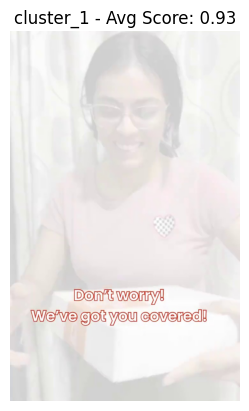


Cluster: cluster_2, Average Score: 0.73
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_2/217_video_face2.jpg


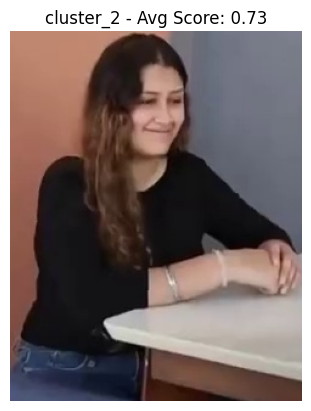


Cluster: cluster_5, Average Score: 1.58
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_5/27_video_face2.jpg


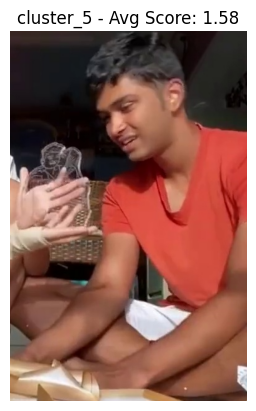


Cluster: cluster_6, Average Score: 0.73
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_6/213_video_face2.jpg


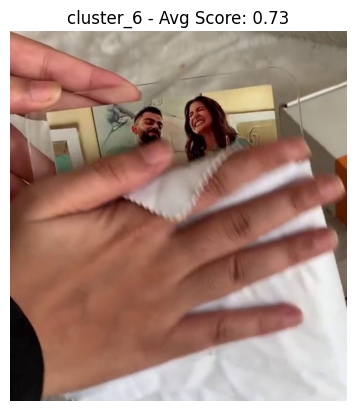


Cluster: cluster_7, Average Score: 0.38
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_7/25_video_face3.jpg


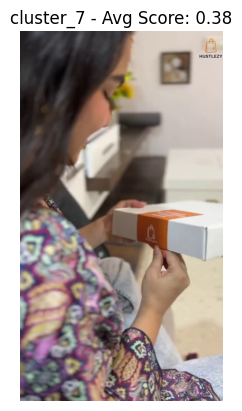


Cluster: cluster_8, Average Score: 0.85
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_8/42_video_face2.jpg


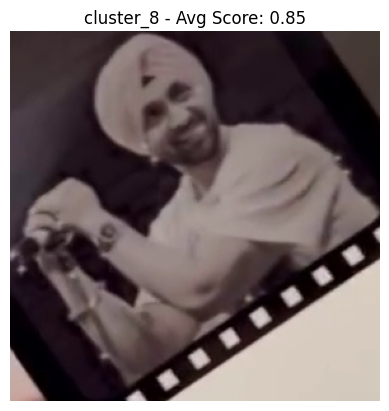


Cluster: cluster_9, Average Score: 0.53
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_9/50_video_face8.jpg


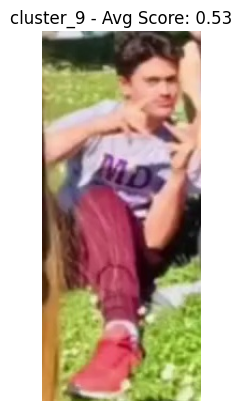


Cluster: cluster_10, Average Score: 0.73
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_10/217_video_face1.jpg


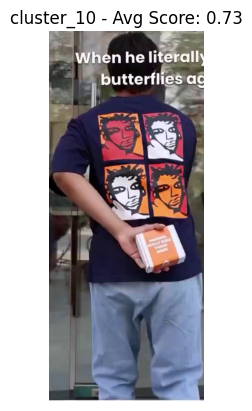


Cluster: cluster_11, Average Score: 0.53
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_11/50_video_face3.jpg


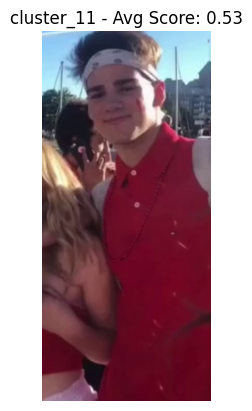


Cluster: cluster_12, Average Score: 1.05
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_12/30_video_face2.jpg


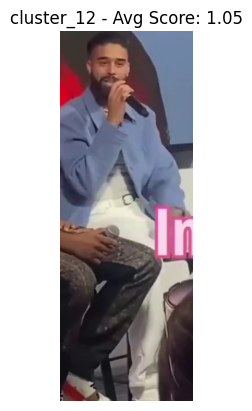


Cluster: cluster_14, Average Score: 1.93
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_14/137_video_face1.jpg


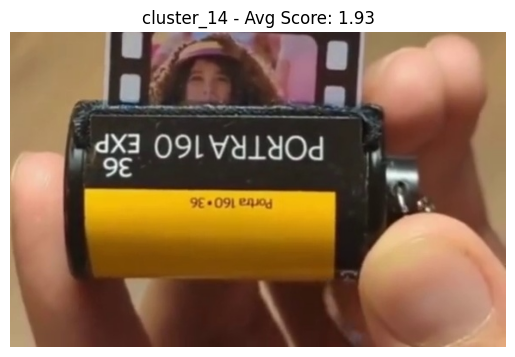


Cluster: cluster_15, Average Score: 0.20
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_15/255_video_face1.jpg


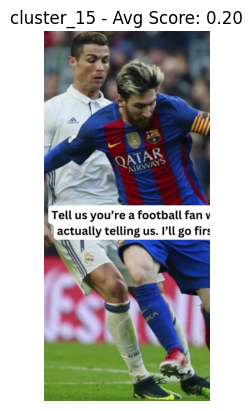


Cluster: cluster_17, Average Score: 0.55
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_17/23_video_face11.jpg


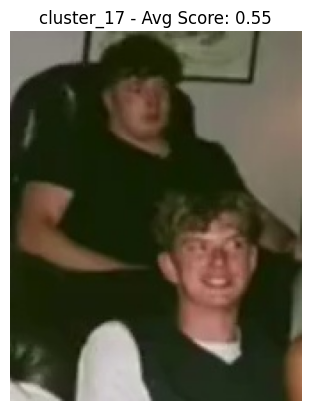


Cluster: cluster_18, Average Score: 1.11
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_18/0_video_face1.jpg


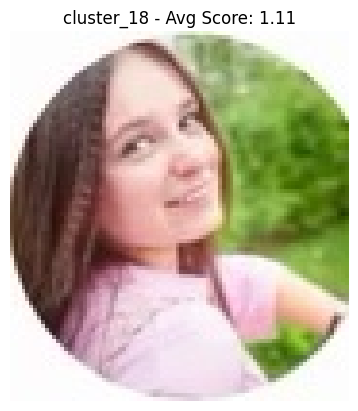


Cluster: cluster_19, Average Score: 0.53
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_19/50_video_face10.jpg


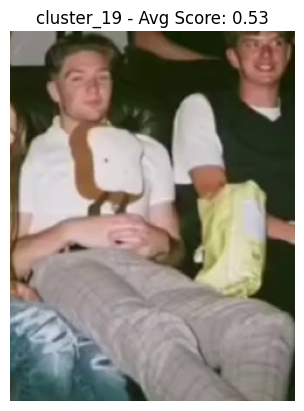


Cluster: cluster_20, Average Score: 2.01
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_20/2_video_face7.jpg


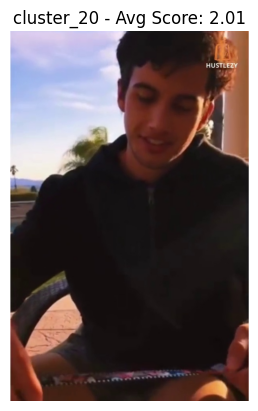


Cluster: cluster_21, Average Score: 1.79
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_21/253_video_face1.jpg


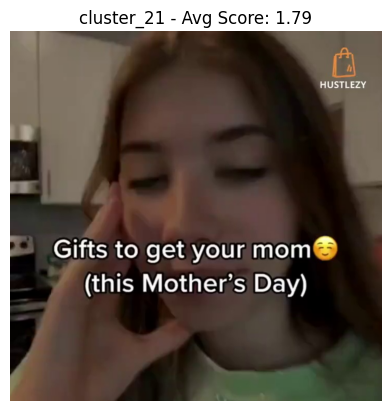


Cluster: cluster_22, Average Score: 1.58
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_22/27_video_face1.jpg


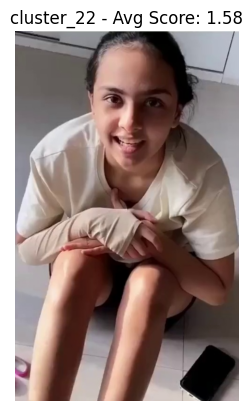


Cluster: cluster_23, Average Score: 1.50
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_23/11_video_face2.jpg


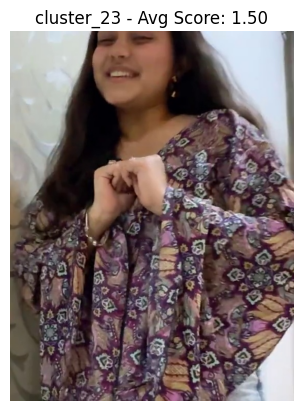


Cluster: cluster_24, Average Score: 0.55
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_24/23_video_face6.jpg


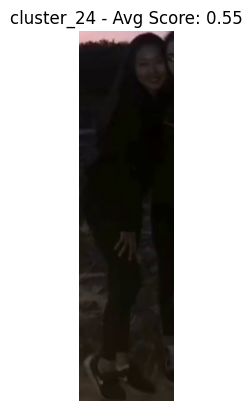


Cluster: cluster_25, Average Score: 0.55
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_25/23_video_face4.jpg


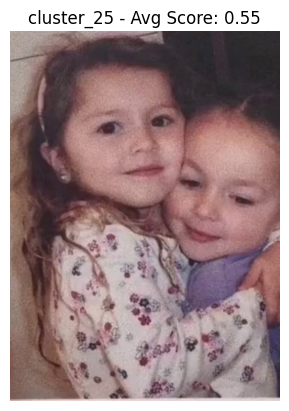


Cluster: cluster_26, Average Score: 0.38
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_26/25_video_face2.jpg


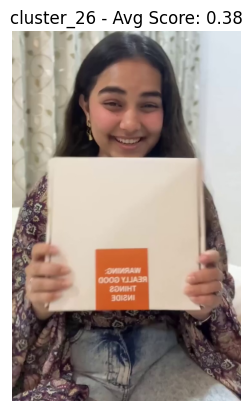


Cluster: cluster_28, Average Score: 0.55
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_28/23_video_face3.jpg


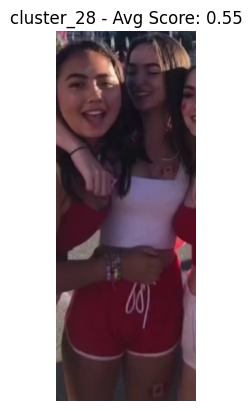


Cluster: cluster_30, Average Score: 1.50
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_30/11_video_face1.jpg


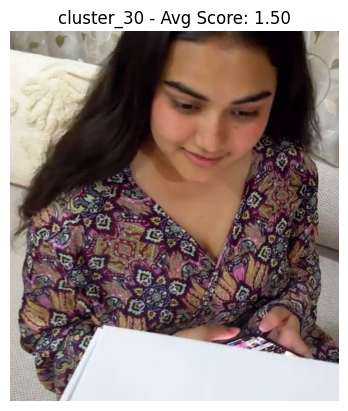


Cluster: cluster_32, Average Score: 2.26
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_32/15_video_face3.jpg


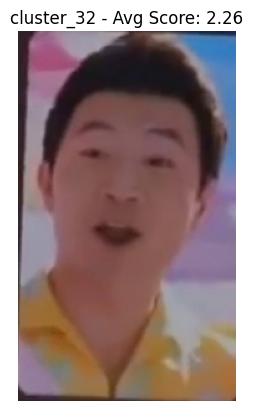


Cluster: cluster_34, Average Score: 2.14
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_34/35_video_face1.jpg


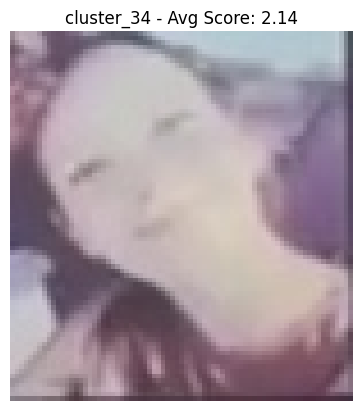


Cluster: cluster_35, Average Score: 0.55
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_35/23_video_face9.jpg


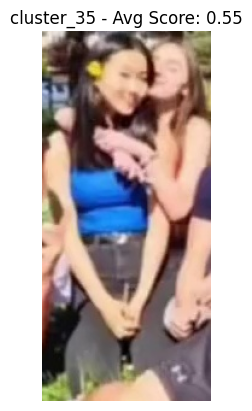


Cluster: cluster_36, Average Score: 1.59
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_36/125_video_face3.jpg


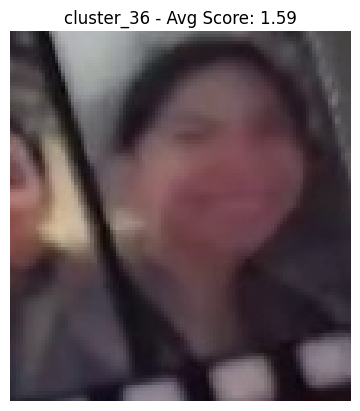


Cluster: cluster_38, Average Score: 1.05
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_38/30_video_face1.jpg


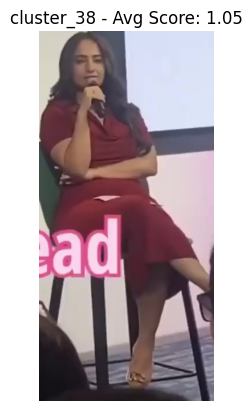


Cluster: cluster_39, Average Score: 0.53
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_39/50_video_face1.jpg


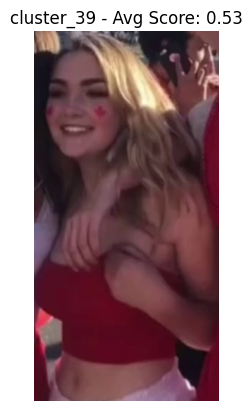


Cluster: cluster_41, Average Score: 1.41
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_41/192_video_face6.jpg


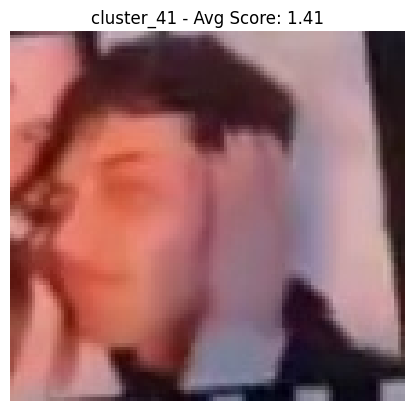


Cluster: cluster_42, Average Score: 0.38
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_42/25_video_face1.jpg


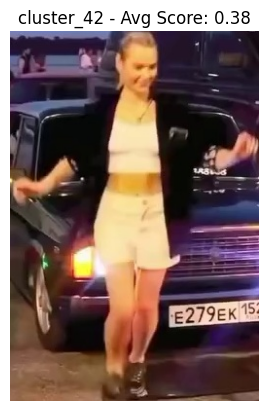


Cluster: cluster_43, Average Score: 0.55
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_43/23_video_face5.jpg


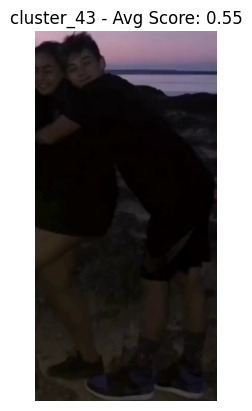


Cluster: cluster_45, Average Score: 1.18
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_45/30_video_face3.jpg


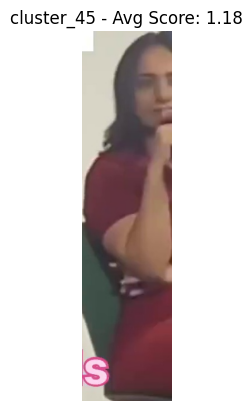


Cluster: cluster_48, Average Score: 0.52
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_48/50_video_face9.jpg


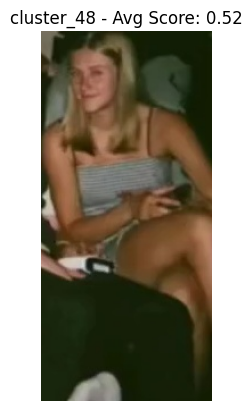


Cluster: cluster_49, Average Score: 1.39
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_49/104_video_face3.jpg


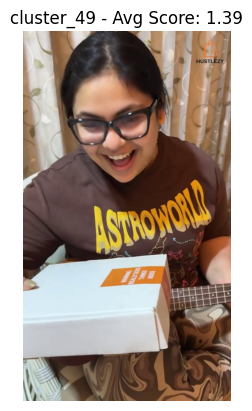


Cluster: cluster_52, Average Score: 0.99
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_52/167_video_face1.jpg


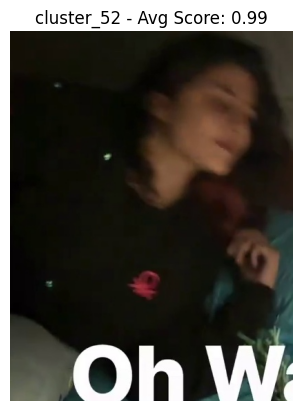


Cluster: cluster_57, Average Score: 2.01
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_57/2_video_face6.jpg


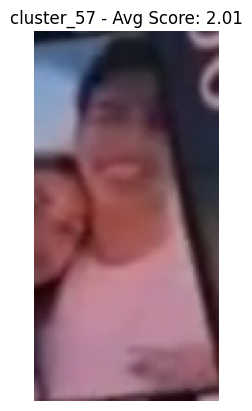


Cluster: cluster_60, Average Score: 2.26
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_60/6_video_face1.jpg


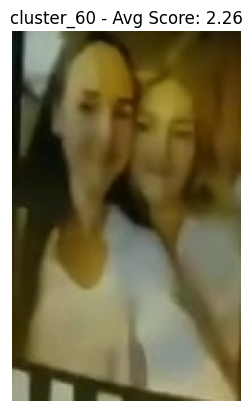


Cluster: cluster_61, Average Score: 0.55
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_61/23_video_face8.jpg


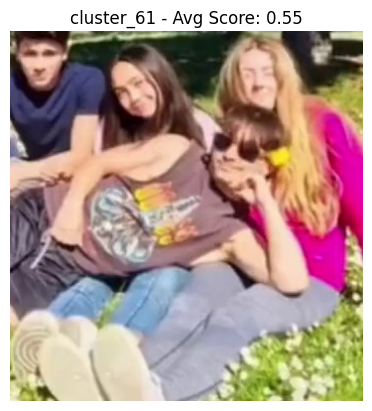


Cluster: cluster_62, Average Score: 0.38
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_62/25_video_face5.jpg


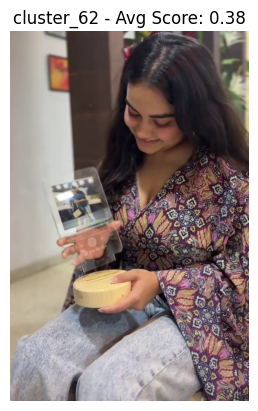


Cluster: cluster_66, Average Score: 0.22
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_66/170_video_face2.jpg


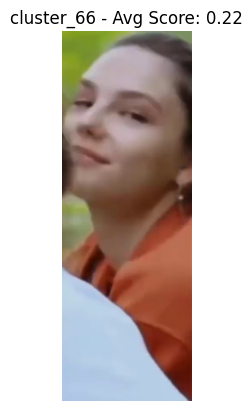


Cluster: cluster_68, Average Score: 0.21
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_68/84_video_face4.jpg


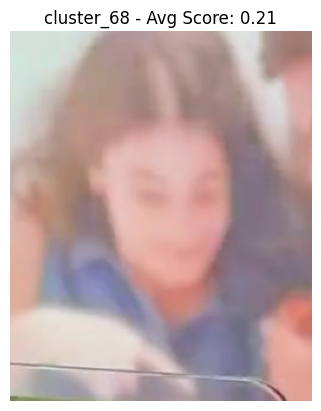


Cluster: cluster_69, Average Score: 0.52
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_69/50_video_face4.jpg


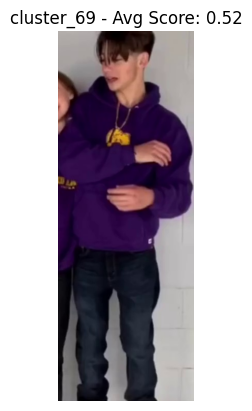


Cluster: cluster_72, Average Score: 0.24
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_72/95_video_face3.jpg


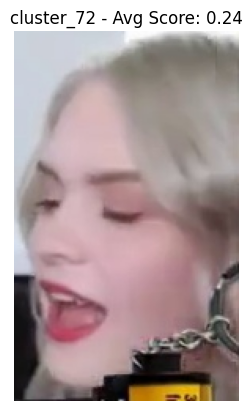


Cluster: cluster_73, Average Score: 0.24
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_73/95_video_face2.jpg


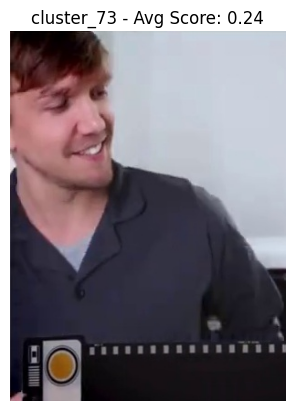


Cluster: cluster_74, Average Score: 0.22
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_74/170_video_face1.jpg


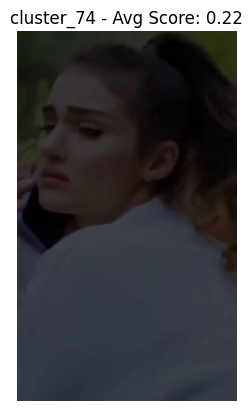


Cluster: cluster_75, Average Score: 1.53
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_75/82_video_face1.jpg


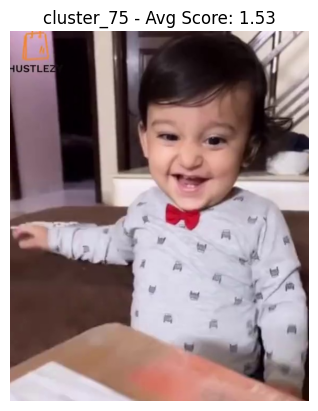


Cluster: cluster_76, Average Score: 0.81
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_76/192_video_face4.jpg


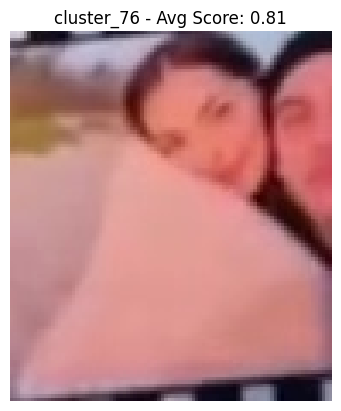


Cluster: cluster_77, Average Score: 0.72
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_77/42_video_face1.jpg


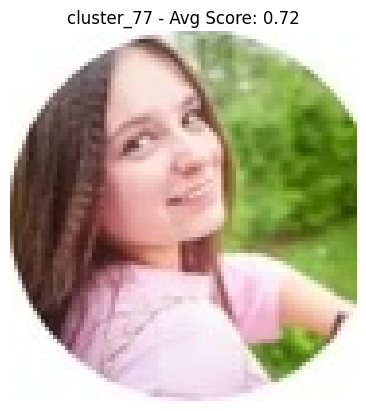


Cluster: cluster_78, Average Score: 0.22
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_78/170_video_face3.jpg


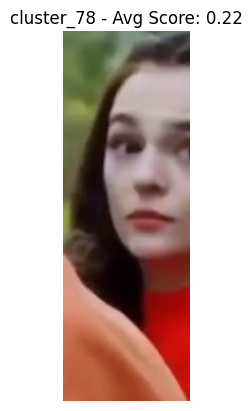


Cluster: cluster_80, Average Score: 0.81
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_80/192_video_face5.jpg


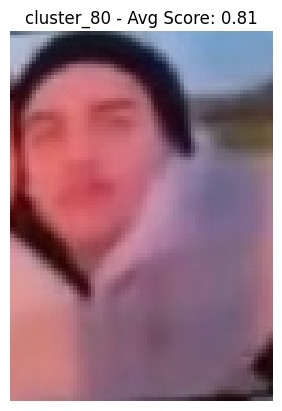


Cluster: cluster_83, Average Score: 2.26
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_83/15_video_face1.jpg


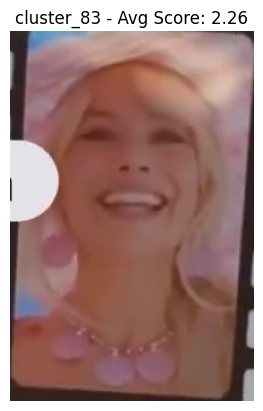


Cluster: cluster_84, Average Score: 0.66
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_84/213_video_face3.jpg


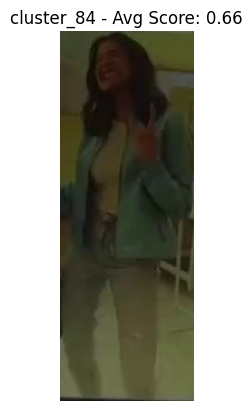


Cluster: cluster_86, Average Score: 0.24
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_86/95_video_face1.jpg


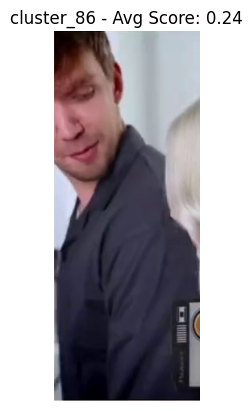


Cluster: cluster_89, Average Score: 0.99
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_89/167_video_face2.jpg


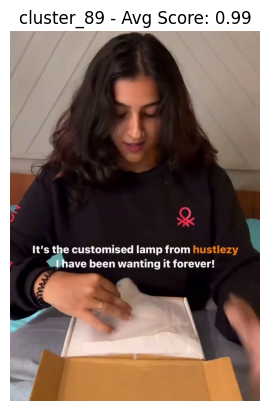


Cluster: cluster_90, Average Score: 1.17
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_90/157_video_face1.jpg


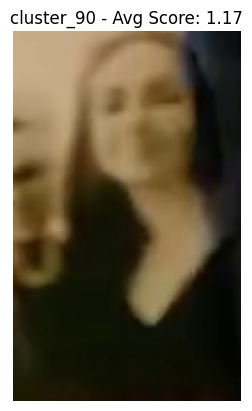


Cluster: cluster_91, Average Score: 0.71
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_91/251_video_face3.jpg


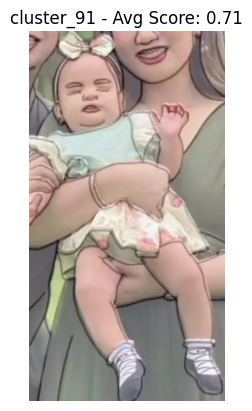


Cluster: cluster_93, Average Score: 0.31
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_93/26_video_face2.jpg


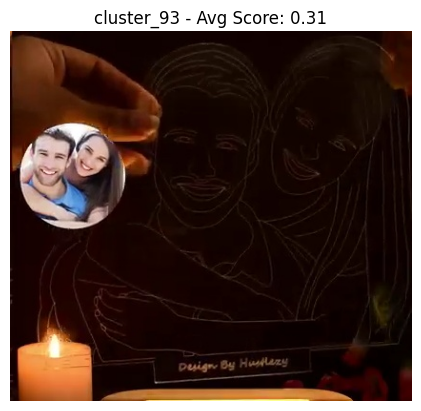


Cluster: cluster_96, Average Score: 1.21
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_96/209_video_face1.jpg


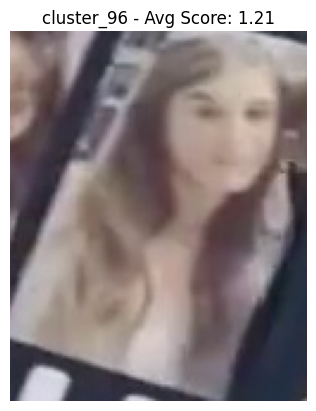


Cluster: cluster_97, Average Score: 0.46
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_97/59_video_face1.jpg


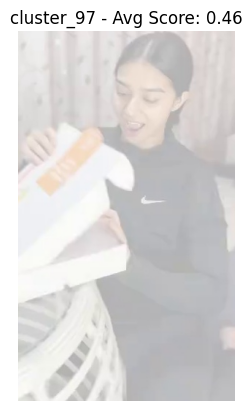


Cluster: cluster_98, Average Score: 0.71
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_98/251_video_face1.jpg


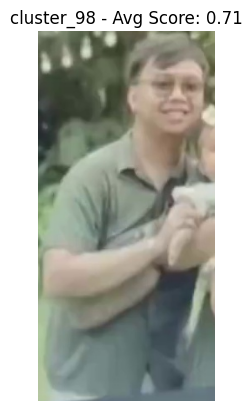


Cluster: cluster_100, Average Score: 0.81
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_100/192_video_face2.jpg


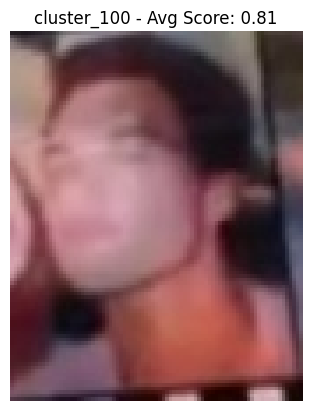


Cluster: cluster_101, Average Score: 0.46
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_101/59_video_face3.jpg


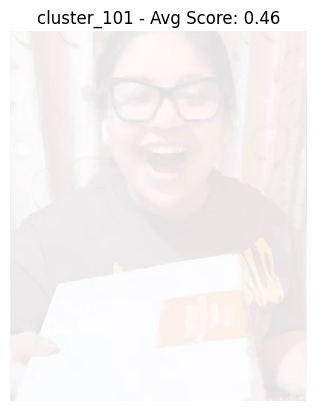


Cluster: cluster_104, Average Score: 0.86
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_104/217_video_face3.jpg


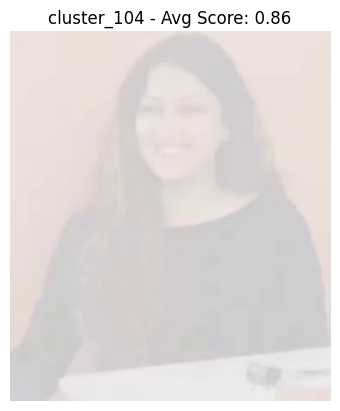


Cluster: cluster_105, Average Score: 0.32
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_105/140_video_face1.jpg


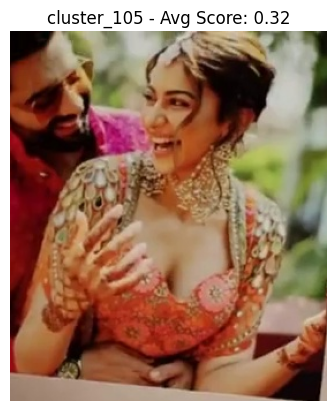


Cluster: cluster_108, Average Score: 0.31
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_108/26_video_face1.jpg


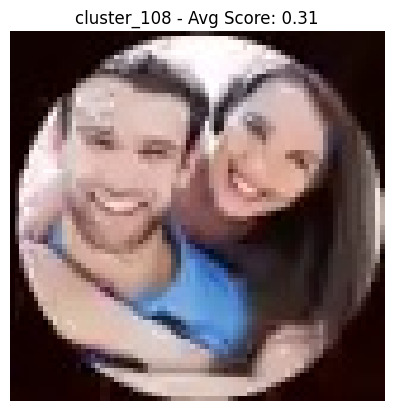


Cluster: cluster_109, Average Score: 0.52
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_109/50_video_face6.jpg


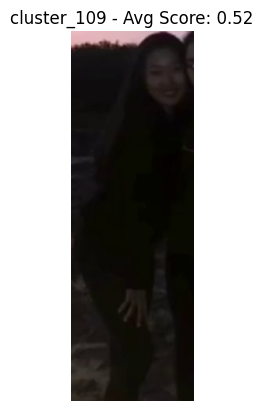


Cluster: cluster_110, Average Score: 0.73
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_110/213_video_face1.jpg


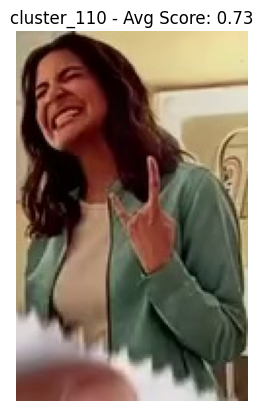


Cluster: cluster_111, Average Score: 1.39
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_111/104_video_face1.jpg


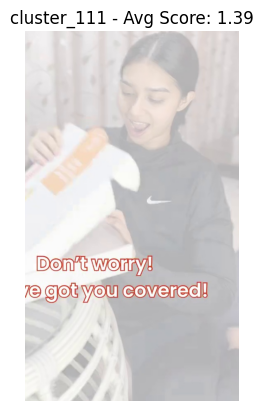


Cluster: cluster_112, Average Score: 1.05
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_112/202_video_face1.jpg


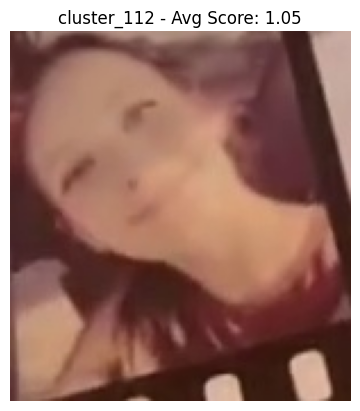


Cluster: cluster_114, Average Score: 0.71
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_114/251_video_face2.jpg


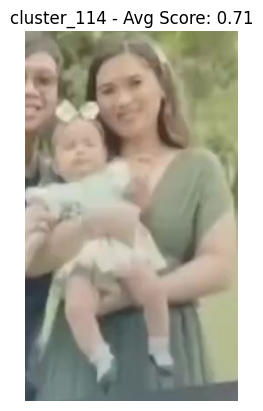


Cluster: cluster_117, Average Score: 1.16
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_117/154_video_face1.jpg


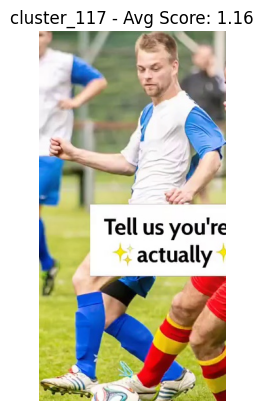


Cluster: cluster_118, Average Score: 0.24
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_118/95_video_face4.jpg


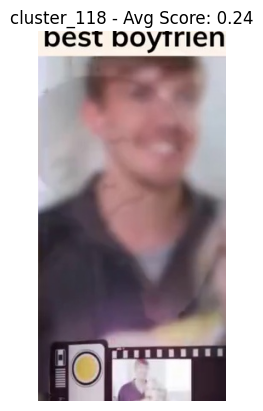


Cluster: cluster_119, Average Score: 0.83
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_119/101_video_face1.jpg


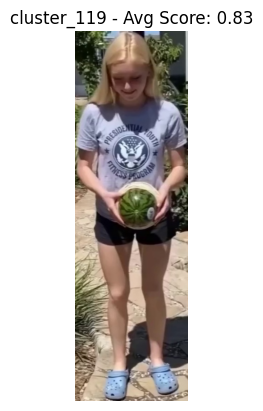


Cluster: cluster_120, Average Score: 1.16
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_120/154_video_face2.jpg


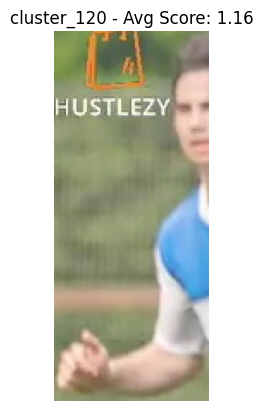


Cluster: cluster_122, Average Score: 1.50
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_122/254_video_face1.jpg


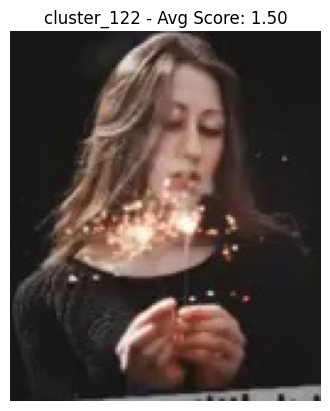


Cluster: cluster_124, Average Score: 1.79
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_124/146_video_face1.jpg


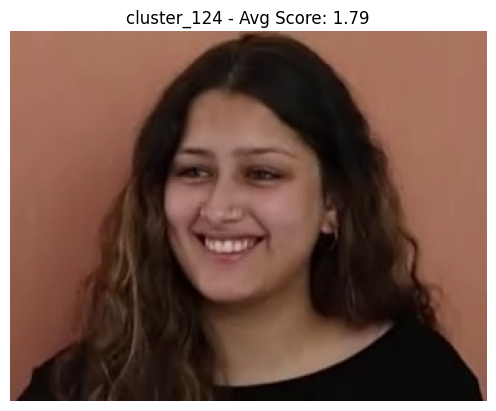


Cluster: cluster_125, Average Score: 0.52
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_125/50_video_face2.jpg


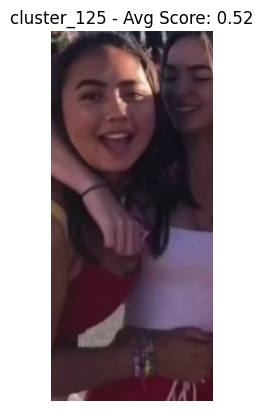


Cluster: cluster_127, Average Score: 0.32
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_127/140_video_face3.jpg


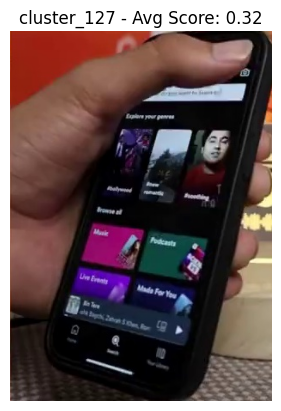


Cluster: cluster_128, Average Score: 0.81
Displaying image: /content/drive/MyDrive/assi_Data_video/faces_yolo/cluster_128/192_video_face1.jpg


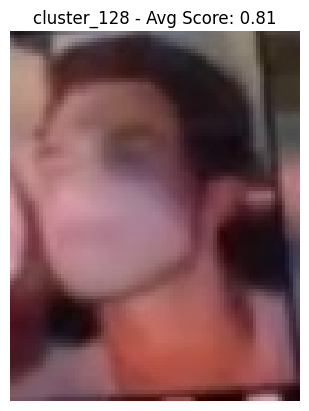

Step 3 Completed: Displayed images and scores.

Process Completed.


In [13]:
# Step 3: Display results
display_cluster_results(cluster_scores, cluster_images)

print("\nProcess Completed.")

# Saving Results in pdf format so that you can easily see it
## Pdf contains Creater image and his/her average score

In [14]:
pip install reportlab


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 19.4 MB/s eta 0:00:00


In [17]:
from reportlab.lib.pagesizes import letter
from reportlab.lib import colors
from reportlab.pdfgen import canvas
import cv2
from pathlib import Path

def save_to_pdf(cluster_scores, cluster_images, output_pdf):
    """Step 3: Save cluster scores and images to a PDF document."""
    c = canvas.Canvas(output_pdf, pagesize=letter)
    width, height = letter

    y_position = height - 50  # Starting Y position for writing content
    padding = 20  # Padding for the spacing between clusters

    for cluster_name, avg_score in cluster_scores.items():
        # Write cluster name and average score
        c.setFont("Helvetica-Bold", 14)
        c.drawString(30, y_position, f"Avg Score: {avg_score:.2f}")
        y_position -= 20

        # Check if there are images in the cluster
        if cluster_images[cluster_name]:
            img_path = str(cluster_images[cluster_name][0])  # Use the first image in the cluster
            try:
                # Check the image dimensions and scale if necessary
                img = cv2.imread(img_path)
                height_img, width_img, _ = img.shape
                aspect_ratio = width_img / height_img

                # Calculate image size for PDF (resize based on aspect ratio)
                img_width = 200  # Set the image width
                img_height = int(img_width / aspect_ratio)

                # Place image on the PDF
                c.drawImage(img_path, 30, y_position - img_height, width=img_width, height=img_height)
                y_position -= img_height + padding  # Adjust y_position after the image

            except Exception as e:
                print(f"Error loading image {img_path}: {e}")

        # After each cluster, check if there's enough space for more content
        if y_position < 100:  # If space is running out, create a new page
            c.showPage()
            y_position = height - 50  # Reset Y position for new page

        # Add some padding between clusters
        y_position -= padding

    # Save the PDF
    c.save()
    print(f"Saved results to {output_pdf}")

# Paths
output_pdf = "/content/drive/MyDrive/assi_Data_video/results_creaters-and-their-Scores.pdf"  # Path to save the results as PDF

# Step 3: Save results to PDF
save_to_pdf(cluster_scores, cluster_images, output_pdf)


Saved results to /content/drive/MyDrive/assi_Data_video/results_creaters-and-their-Scores.pdf
